In [38]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
from tifffile import imread, imwrite

from caImageAnalysis import BrukerFish
from caImageAnalysis.utils import fix_phase_offset
from caImageAnalysis.visualize import visualize_images, visualize_plane_over_time_mpl

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Change the exp_folder to the path of the experiment

In [72]:
# Change this path to the experiment folder
exp_folder = r'/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417'
region = ''

In [73]:
# Initialize BrukerFish
fish = BrukerFish(exp_folder, region=region)
fish.data_paths

/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:22: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual environment, it may use a different parser and behave differently.

The code that caused this warning is on line 22 of the file /Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py. To get rid of this warning, pass the additional argument 'features="html.parser"' to the BeautifulSoup constructor.

  Bs_data = BeautifulSoup(xml)
/Users/minelarinel/caImageAnalysis/caImageAnalysis/bruker_2P/voltage_output.py:48: GuessedAtParserWarning: No parser was explicitly specified, so I'm using the best available HTML parser for this system ("html.parser"). This usually isn't a problem, but if you run this code on another system, or in a different virtual envi

{'raw': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417/vagal_L-000'),
 'frametimes': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417/frametimes.txt'),
 'raw_image': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417/ch2.tif'),
 'anatomy': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417/vagal_L-000/vagal_L-000_Cycle01175_Ch2_000001.ome.tif'),
 'log': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417/vagal_L-000/vagal_L-000.xml'),
 'voltage_output': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417/vagal_L-000/vagal_L-000_Cycle00001_VoltageOutput_001.xml'),
 'references': PosixPath('/Volumes/Rapid/bruker2P_data/elavl3H2BGCaMP8m_8dpf_fed_glucose_25mM_34_20240417/vagal_L-000/References')}

In [74]:
# Load the full image
img = np.array(imread(fish.data_paths['raw_image']))

## Visualize image to find the range to fix

In [75]:
iw = visualize_images(imgs=img)

iw.show()

RFBOutputContext()

No such comm: 52324de26cc94e078b1b29e55595943a
No such comm: 52324de26cc94e078b1b29e55595943a


In [76]:
iw.plot.canvas.close()

In [77]:
# Enter the index range to fix
# Includes start and stop
fix_range = [141, 200]

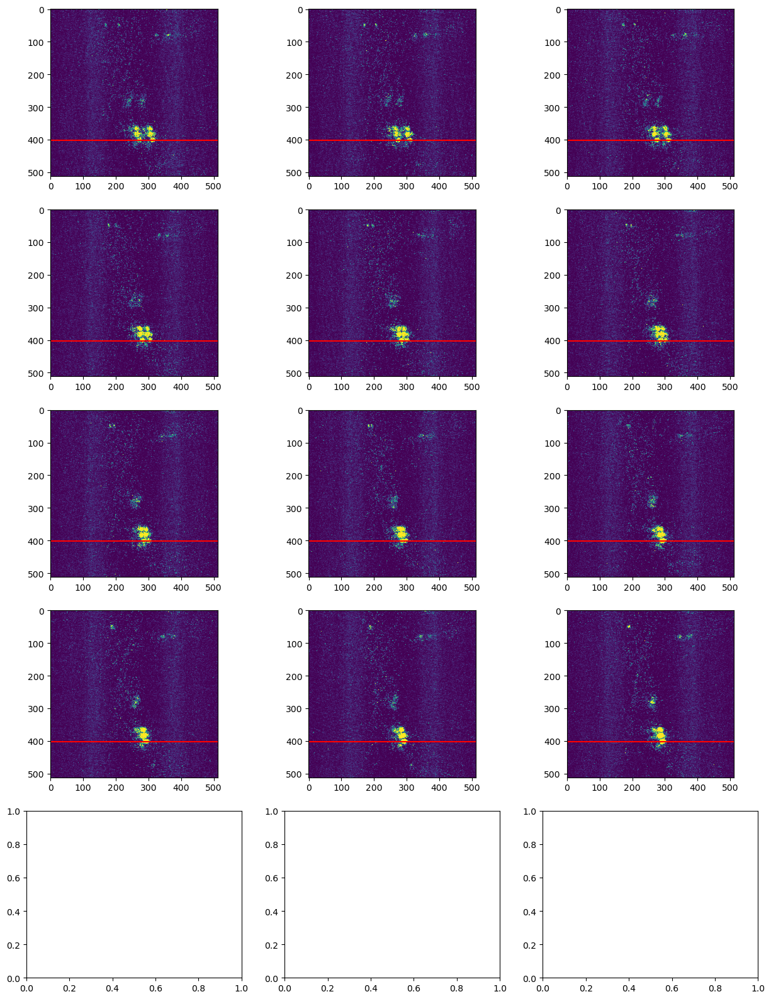

In [103]:
# Visualize a plane over time
plane = 4
img_row = 402

plane_indices = visualize_plane_over_time_mpl(fish, plane, 5, frame_range=fix_range, vmin=0, vmax=27.9, img_row=img_row)


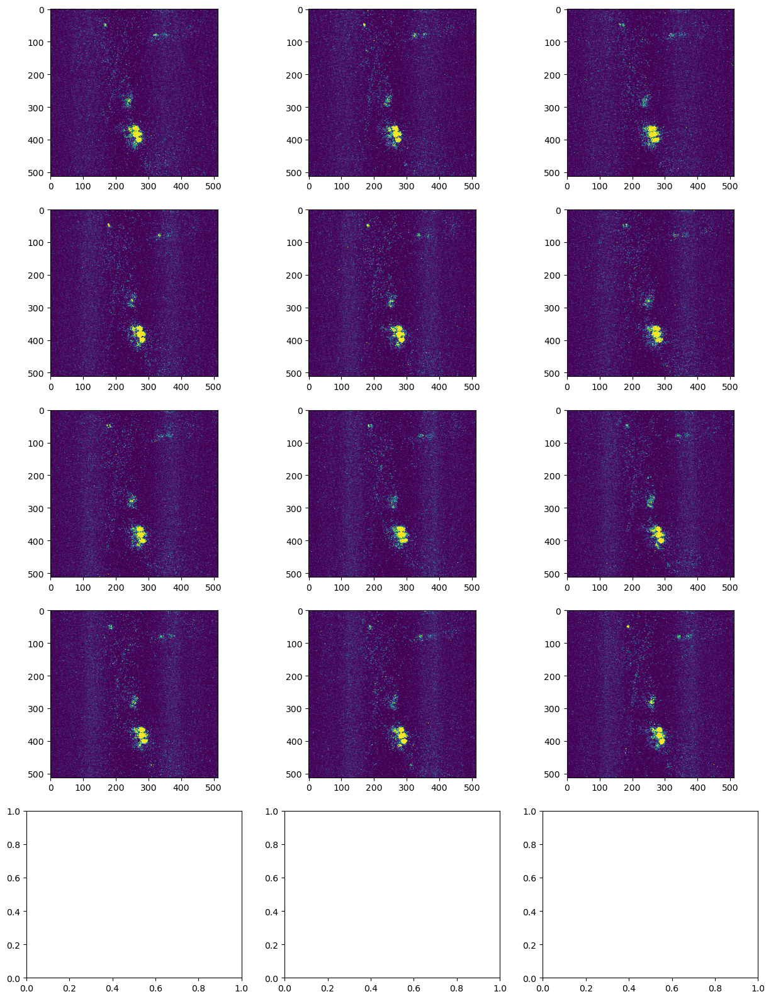

In [104]:
fixed_imgs = fix_phase_offset(img[plane_indices, :, :], img_row, n_cols=3, show_phase_plots=False, show_updated_plots=True, show_difference_plots=False)

In [105]:
# If the phase correction looks good, change the original image
for i, val in enumerate(plane_indices):
    img[val, :, :] = fixed_imgs[i, :, :]

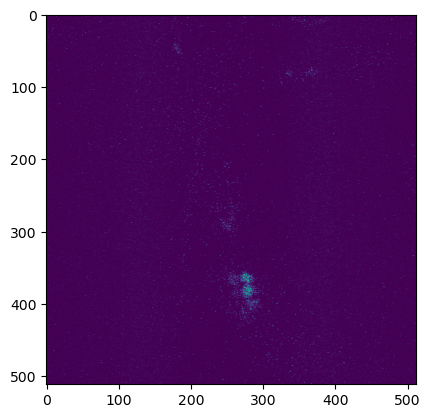

In [106]:
# Save the image
if len(fish.region) > 0:
	ch_image_path = Path(os.path.join(fish.exp_path, f'{fish.region}_ch2.tif'))
else:
	ch_image_path = Path(os.path.join(fish.exp_path, 'ch2.tif'))

if os.path.exists(ch_image_path):
	os.remove(ch_image_path)

imwrite(ch_image_path, img, bigtiff=True)
fish.data_paths['raw_image'] = ch_image_path

plt.imshow(img[0])

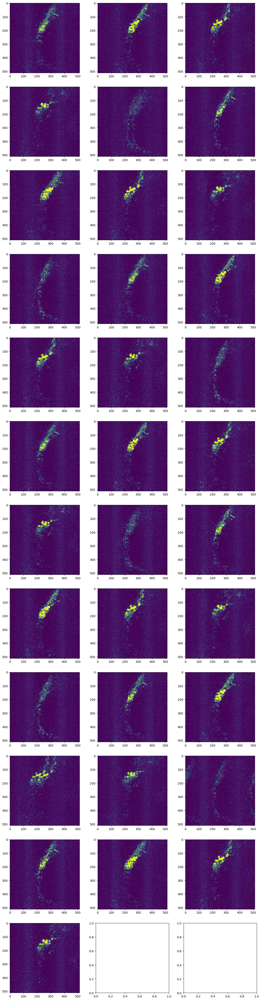

In [41]:
# Visualize all the frames from all the planes
n_images = fix_range[1] - fix_range[0] + 1
n_cols = 3

fig, ax = plt.subplots(int(n_images / n_cols)+1, n_cols, figsize=(5*n_cols, np.ceil(n_images / n_cols) * 5))

for i in range(n_images):
	row = int(i / 3)
	col = i % 3

	ax[row, col].imshow(img[fix_range[0]+i], vmin=0, vmax=27.9)